In [7]:
# Однослойный перцептрон

import numpy as np

# Класс, реализующий функции однослойного перцепторна
class Perceptron:
    #Инициализация весов и скорости обучения
    def __init__(self, num_inputs, learning_rate=0.01):
        self.weights = np.random.rand(num_inputs + 1)
        self.learning_rate = learning_rate
    
    # Определение взвешенной суммы
    def linear(self, inputs):
        Z = inputs @ self.weights[1:].T + + self.weights[0]
        return Z
    
    # Функция активации Хэвисайда
    def Heaviside_step_fn(self, z):
        if z>=0:
            return 1
        else:
            return 0
        
    # Прогнозирование
    def predict(self, inputs):
        Z = self.linear(inputs)
        try:
            pred = []
            for z in Z:
                pred.append(self.Heaviside_step_fn(z))
        except:
            return self.Heaviside_step_fn(Z)
        return pred
    
    # Определение функции потерь (разность вычисленного значения и эталонного)
    def loss(self, prediction, target):
        loss = (prediction-target)
        return loss
    
    # Обучение
    def train(self, inputs, target):
        prediction = self.predict(inputs)
        error = self.loss(prediction, target)
        self.weights[1:] += self.learning_rate * error * inputs
        self.weights[0]  += self.learning_rate * error
        
    # Подготовка модели (обучение в несколько эпох)
    def fit(self, X, y, num_epochs):
        for epoch in range(num_epochs):
            for inputs, target in zip(X, y):
                self.train(inputs, target)

Epoch [1/10], weight:[[0.5852702  0.22194618]], bias:[-0.18648523] Loss: -180.0000
Epoch [2/10], weight:[[0.54036945 0.00833971]], bias:[-0.09648505] Loss: -90.0000
Epoch [3/10], weight:[[ 0.48068443 -0.11170994]], bias:[-0.04648501] Loss: -50.0000
Epoch [4/10], weight:[[ 0.42955756 -0.18071002]], bias:[-0.01548503] Loss: -31.0000
Epoch [5/10], weight:[[ 0.3885263  -0.22073698]], bias:[-0.00448503] Loss: -11.0000
Epoch [6/10], weight:[[ 0.35421088 -0.24809156]], bias:[0.00251497] Loss: -7.0000
Epoch [7/10], weight:[[ 0.32529688 -0.2677739 ]], bias:[0.00351497] Loss: -1.0000
Epoch [8/10], weight:[[ 0.29971743 -0.2835131 ]], bias:[0.00251497] Loss: 1.0000
Epoch [9/10], weight:[[ 0.2774169 -0.2957106]], bias:[0.00551497] Loss: -3.0000
Epoch [10/10], weight:[[ 0.2578396  -0.30534828]], bias:[0.00751497] Loss: -2.0000
Accuracy on Test Dataset: 0.9700000286102295


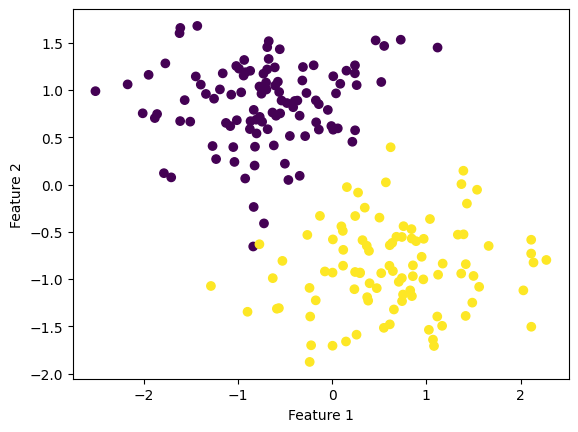

In [15]:
import torch
import torch.nn as nn
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Подготовка датасета с двумя классами двумя признаками
X, y = make_blobs(n_samples=1000, n_features=2, centers=2, cluster_std=3, random_state=23)

# Разбиение датасета на обучающий и тестовый наборы
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2,
                                                    random_state=23,
                                                    shuffle=True
                                                   )

# Нормализация датасета
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Приведение наборов данных к стандартам PyTorch
X_train = torch.tensor(X_train, dtype=torch.float32, requires_grad=False)
X_test = torch.tensor(X_test, dtype=torch.float32, requires_grad=False)
y_train = torch.tensor(y_train, dtype=torch.float32, requires_grad=False)
y_test = torch.tensor(y_test, dtype=torch.float32, requires_grad=False)

# Приведение эталонных наборов к нормальному размеру
y_train = y_train.reshape(-1, 1)
y_test = y_test.reshape(-1, 1)

torch.random.seed()

# Переопределение перцептрона для работы с объектами PyTorch
class Perceptron(nn.Module):
    def __init__(self, num_inputs):
        super(Perceptron, self).__init__()
        self.linear = nn.Linear(num_inputs, 1)
        
    def heaviside_step_fn(self,Z):
        Class = []
        for z in Z:
            if z >=0:
                Class.append(1)
            else:
                Class.append(0)
        return torch.tensor(Class)
    
    def forward(self, x):
        Z = self.linear(x)
        return self.heaviside_step_fn(Z)
        

# Инициализация пецептрона
perceptron = Perceptron(num_inputs=X_train.shape[1])

def loss(y_pred,Y):
    cost = y_pred-Y
    return cost


# Скорость обучения
learning_rate = 0.001

# Обучение
num_epochs = 10
for epoch in range(num_epochs):
    Losses = 0
    for Input, Class in zip(X_train, y_train):
        # Forward pass
        predicted_class = perceptron(Input)
        error = loss(predicted_class, Class)
        Losses += error

        w = perceptron.linear.weight
        b = perceptron.linear.bias

        w = w - learning_rate * error * Input
        b = b - learning_rate * error

        perceptron.linear.weight = nn.Parameter(w)
        perceptron.linear.bias   = nn.Parameter(b)
    print('Epoch [{}/{}], weight:{}, bias:{} Loss: {:.4f}'.format(
        epoch+1,num_epochs,
        w.detach().numpy(),
        b.detach().numpy(),
        Losses.item()))

# Проверка обученно модели на тестовом наборе
pred = perceptron(X_test)
accuracy = (pred==y_test[:,0]).float().mean()
print("Accuracy on Test Dataset:", accuracy.item())
    
# Графическое отображение полученных результатов
plt.scatter(X_test[:, 0], X_test[:, 1], c=pred)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def load_dataset():
	with np.load("mnist.npz") as f:
		# convert from RGB to Unit RGB
		x_train = f['x_train'].astype("float32") / 255

		# reshape from (60000, 28, 28) into (60000, 784)
		x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1] * x_train.shape[2]))

		# labels
		y_train = f['y_train']

		# convert to output layer format
		y_train = np.eye(10)[y_train]

		return x_train, y_train


In [3]:
x_train, y_train = load_dataset()

weights_input_to_hidden = np.random.uniform(-0.5, 0.5, (20, 784)) # Веса между входным и скрытым слоями
weights_hidden_to_output = np.random.uniform(-0.5, 0.5, (10, 20)) # Веса между скрытым и выходным слоями
bias_input_to_hidden = np.zeros((20, 1)) # Смещение между входным и скрытым слоями
bias_hidden_to_output = np.zeros((10, 1)) # Смещение между скрытым и выходным слоями

epochs = 10 # Кол-во эпох обучения
e_loss = 0 # Инициализация значения потерь
e_correct = 0 # Инициализации коррекции
learning_rate = 0.01 # Скорость обучения

for epoch in range(epochs):
    print(f"Epoch №{epoch}")
    for image, label in zip(x_train, y_train):
        image = np.reshape(image, (-1, 1))
        label = np.reshape(label, (-1, 1))
        
        hidden_raw = bias_input_to_hidden + weights_input_to_hidden @ image # Вычисление взвешенных значений на входе слоя
        hidden = 1 / (1 + np.exp(-hidden_raw)) # Функция активации - сигмоид
        
        output_raw = bias_hidden_to_output + weights_hidden_to_output @ hidden # Вычисление взвешенных значений на входе слоя
        output = 1 / (1 + np.exp(-output_raw)) # Функция активации - сигмоид
        
        # Расчёт потерь и коррекции
        e_loss += 1 / len(output) * np.sum((output - label) ** 2, axis=0)
        e_correct += int(np.argmax(output) == np.argmax(label))
        
        # Backpropagation (output layer)
        delta_output = output - label
        weights_hidden_to_output += -learning_rate * delta_output @ np.transpose(hidden)
        bias_hidden_to_output += -learning_rate * delta_output
        
        # Backpropagation (hidden layer)
        delta_hidden = np.transpose(weights_hidden_to_output) @ delta_output * (hidden * (1 - hidden))
        weights_input_to_hidden += -learning_rate * delta_hidden @ np.transpose(image)
        bias_input_to_hidden += -learning_rate * delta_hidden
    print(f"Loss: {round((e_loss[0] / x_train.shape[0]) * 100, 3)}%")
    print(f"Accuracy: {round((e_correct / x_train.shape[0]) * 100, 3)}%")
    print("----------")
    e_loss = 0
    e_correct = 0

# Берём своё изображение
test_image = plt.imread("custom_7.jpg", format="jpeg")

# Приведение изображения виду датасета MNIST
gray = lambda rgb : np.dot(rgb[... , :3] , [0.299 , 0.587, 0.114]) 
test_image = 1 - (gray(test_image).astype("float32") / 255)

# Преобразование изображения к виду массива
test_image = np.reshape(test_image, (test_image.shape[0] * test_image.shape[1]))

# Предсказание заданного изображения обученной моделью
image = np.reshape(test_image, (-1, 1))

hidden_raw = bias_input_to_hidden + weights_input_to_hidden @ image
hidden = 1 / (1 + np.exp(-hidden_raw))

output_raw = bias_hidden_to_output + weights_hidden_to_output @ hidden
output = 1 / (1 + np.exp(-output_raw))

print(output)
plt.imshow(test_image.reshape(28, 28), cmap="Greys")
plt.title(f"NN suggests the CUSTOM number is: {output.argmax()}")
plt.show()

Epoch №0
[[0.2538922 ]
 [0.01606104]
 [0.16609578]
 [0.64296175]
 [0.37977639]
 [0.92465764]
 [0.0244354 ]
 [0.4296333 ]
 [0.07252407]
 [0.00399161]
 [0.6936071 ]
 [0.89337513]
 [0.12758429]
 [0.4435529 ]
 [0.00680913]
 [0.54882071]
 [0.02155409]
 [0.36990158]
 [0.76093307]
 [0.909503  ]]
[[0.77842778]
 [0.17409939]
 [0.10263776]
 [0.29680007]
 [0.98495139]
 [0.60924116]
 [0.12036972]
 [0.84626878]
 [0.02063508]
 [0.01609039]
 [0.71325097]
 [0.98437676]
 [0.01766414]
 [0.11193206]
 [0.51032245]
 [0.99523741]
 [0.01333871]
 [0.65459906]
 [0.88930602]
 [0.81966273]]
[[0.89800799]
 [0.60200988]
 [0.01267922]
 [0.93311627]
 [0.11080211]
 [0.18150443]
 [0.41331767]
 [0.97872825]
 [0.62575919]
 [0.0144154 ]
 [0.91140748]
 [0.34412719]
 [0.36650157]
 [0.95294855]
 [0.67368199]
 [0.887065  ]
 [0.25614917]
 [0.29545516]
 [0.6318229 ]
 [0.20870545]]
[[0.02960648]
 [0.82513661]
 [0.04069781]
 [0.99175987]
 [0.44398472]
 [0.27604692]
 [0.02368749]
 [0.0607872 ]
 [0.4918598 ]
 [0.03141368]
 [0.3734

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



[[0.52311786]
 [0.92879846]
 [0.02506084]
 [0.99402207]
 [0.04753174]
 [0.99741487]
 [0.36451937]
 [0.99953233]
 [0.01865146]
 [0.02091336]
 [0.96768083]
 [0.04001154]
 [0.14909967]
 [0.9747031 ]
 [0.26080212]
 [0.99995756]
 [0.13370567]
 [0.98210235]
 [0.03400156]
 [0.61654677]]
[[0.21706128]
 [0.36849758]
 [0.22090046]
 [0.96499881]
 [0.02284544]
 [0.92828041]
 [0.85689052]
 [0.95781477]
 [0.82803625]
 [0.03416639]
 [0.98167657]
 [0.01761505]
 [0.85097378]
 [0.43613825]
 [0.2031891 ]
 [0.99701762]
 [0.12522207]
 [0.00697616]
 [0.79625471]
 [0.07790924]]
[[9.99999443e-01]
 [9.99621299e-01]
 [1.12854321e-05]
 [8.29873179e-01]
 [9.99055214e-01]
 [9.23591122e-02]
 [8.69602805e-06]
 [9.82779830e-01]
 [9.71761164e-01]
 [1.54120860e-05]
 [7.29244039e-05]
 [9.02950190e-01]
 [9.87488700e-01]
 [6.43346466e-04]
 [2.93384232e-06]
 [9.99999627e-01]
 [6.85025374e-03]
 [4.48929353e-01]
 [6.44829914e-01]
 [9.99982896e-01]]
[[9.36055663e-01]
 [2.93191164e-01]
 [1.03843035e-02]
 [8.90380173e-01]
 [4.1

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



[[9.70885349e-01]
 [1.08495076e-02]
 [9.61430235e-01]
 [9.83634750e-01]
 [3.21432261e-01]
 [9.38656982e-01]
 [3.20245896e-03]
 [5.54415878e-02]
 [9.98412350e-01]
 [1.48183417e-04]
 [2.89797271e-01]
 [3.60543339e-01]
 [8.72430592e-01]
 [6.53102165e-02]
 [2.19948250e-04]
 [9.99916289e-01]
 [7.55813121e-01]
 [8.75195684e-03]
 [1.20531756e-03]
 [8.77754170e-01]]
[[1.54221263e-02]
 [4.38032874e-01]
 [9.98692139e-01]
 [5.76332643e-01]
 [1.38639028e-03]
 [8.59523813e-01]
 [2.78696365e-02]
 [9.99321347e-01]
 [1.43594032e-01]
 [8.87117983e-01]
 [9.99829743e-01]
 [9.71191452e-01]
 [3.68049178e-05]
 [9.99999979e-01]
 [5.10804832e-01]
 [9.99963769e-01]
 [2.11117329e-02]
 [9.99662044e-01]
 [1.94084281e-03]
 [9.96020718e-01]]
[[9.99534772e-01]
 [2.99186969e-03]
 [1.81076891e-03]
 [5.44678667e-01]
 [9.05069532e-01]
 [9.56843867e-03]
 [4.25797992e-02]
 [9.45656770e-01]
 [9.99929076e-01]
 [1.36918747e-02]
 [9.84054545e-01]
 [9.75314734e-01]
 [2.53216697e-01]
 [9.98886976e-01]
 [4.62401038e-05]
 [9.9978

KeyboardInterrupt: 